In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Import necessary libraries
import os
import cv2
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from collections import defaultdict
from tqdm import tqdm

# Paths to the dataset folders
BASE_DIR = "/content/drive/MyDrive/dataset_coco"
TRAIN_DIR = os.path.join(BASE_DIR, "train-300/data")
TRAIN_ANNOTATION_FILE = os.path.join(BASE_DIR, "train-300/labels.json")
TEST_DIR = os.path.join(BASE_DIR, "test-30")
VALIDATION_DIR = os.path.join(BASE_DIR, "validation-300/data")
VALIDATION_ANNOTATION_FILE = os.path.join(BASE_DIR, "validation-300/labels.json")

In [ ]:
# Load COCO annotations function
def load_coco_annotations(annotation_file):
    with open(annotation_file, 'r') as f:
        anns = json.load(f)
    return anns

# Map image IDs to annotations
def map_image_ids_to_annotations(annotations):
    image_ids_annotations = defaultdict(list)
    for ann in annotations['annotations']:
        image_id = ann['image_id']
        image_ids_annotations[image_id].append(ann)
    return image_ids_annotations

# Map category IDs to names
def map_category_ids_to_names(annotations):
    return {cat['id']: cat['name'] for cat in annotations['categories']}

In [ ]:
# Visualization function
def visualize_image_with_bboxes(image_path, image_annotations, category_id_to_name, confidence=0.0):
    """
    Visualize an image with bounding boxes, object labels, and confidence scores.
    """
    img = Image.open(image_path)
    fig, ax = plt.subplots(figsize=(12, 12))

    # Display the image
    ax.imshow(img)

    # Loop through annotations and plot bounding boxes and labels
    for ann in image_annotations:
        bbox = ann['bbox']
        name = category_id_to_name[ann['category_id']]

        # Bounding box coordinates
        x = float(bbox[0])
        y = float(bbox[1])
        w = float(bbox[2])
        h = float(bbox[3])

        # Add text and bounding box
        ax.text(
            x + 2, y - 10, f"{name} ({confidence * 100:.2f}%)",
            fontdict={'fontsize': 12, 'fontweight': 'bold', 'color': 'white', 'backgroundcolor': 'red'}
        )
        bb = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(bb)

    ax.axis('off')
    plt.show()

In [ ]:
# Generate light blue heatmap overlay
def generate_dense_blue_heatmap_overlay(image_path, image_annotations):
    """
    Generate a denser blue shadow-like heatmap overlay for detected objects.
    """
    img = cv2.imread(image_path)
    heatmap = np.zeros(img.shape[:2], dtype=np.float32)

    # Loop through annotations and update heatmap
    for ann in image_annotations:
        bbox = ann['bbox']
        x, y, w, h = [int(v) for v in bbox]
        heatmap[y:y+h, x:x+w] += 1  # Increment region by 1

    # Normalize heatmap and scale it for denser effect
    heatmap = heatmap / np.max(heatmap)
    heatmap = np.clip(heatmap * 2.0, 0, 1)  # Scale for denser blue

    # Create a light blue heatmap
    light_blue_heatmap = np.zeros((heatmap.shape[0], heatmap.shape[1], 3), dtype=np.uint8)
    light_blue_heatmap[:, :, 0] = (heatmap * 255).astype(np.uint8)  # Blue channel
    light_blue_heatmap[:, :, 1] = (heatmap * 200).astype(np.uint8)  # Green channel
    light_blue_heatmap[:, :, 2] = (heatmap * 150).astype(np.uint8)  # Red channel

    # Blend the light blue heatmap with the original image
    blended = cv2.addWeighted(img, 0.4, light_blue_heatmap, 0.6, 0)
    blended = cv2.cvtColor(blended, cv2.COLOR_BGR2RGB)

    # Display the blended image
    plt.figure(figsize=(10, 10))
    plt.imshow(blended)
    plt.title("Dense Blue Heatmap Overlay")
    plt.axis('off')
    plt.show()


Visualizing image: 000000000149.jpg


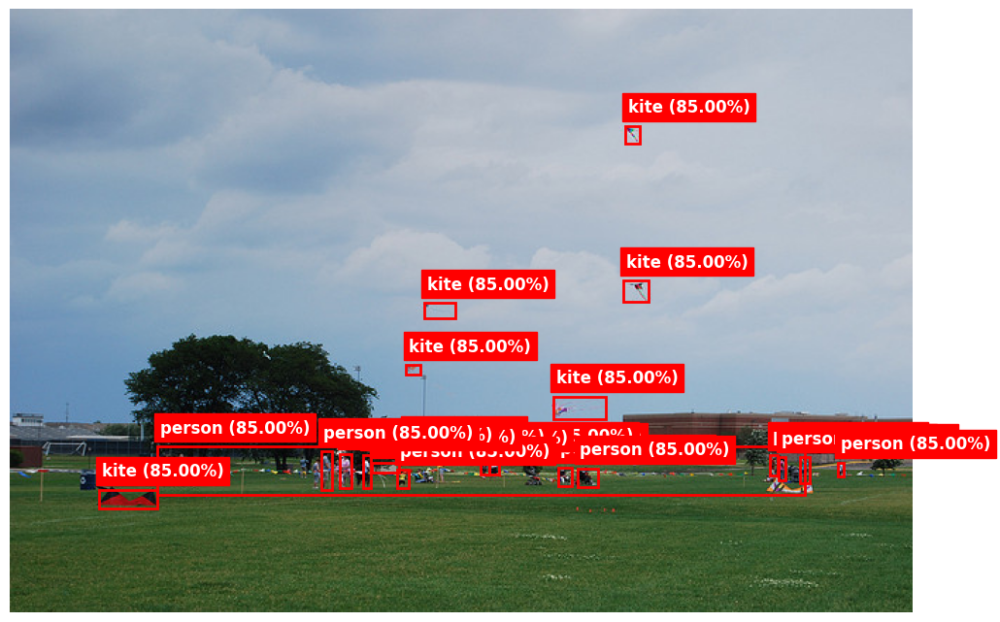

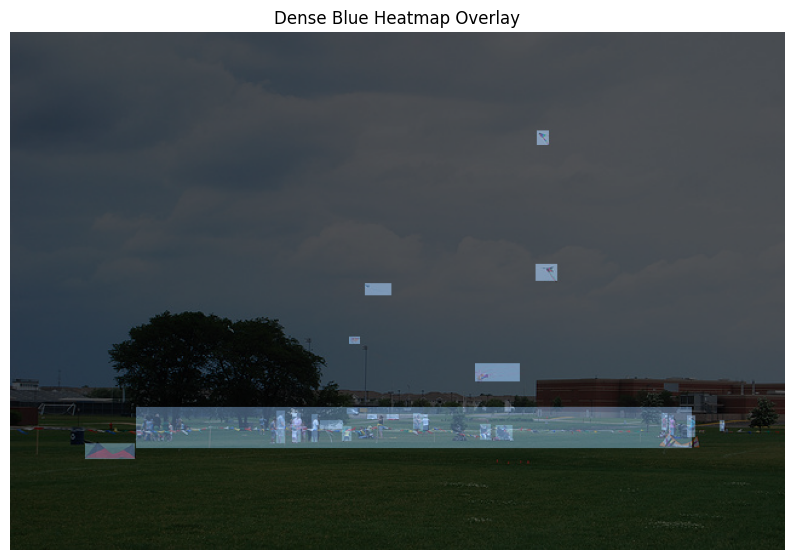

Visualizing image: 000000000260.jpg


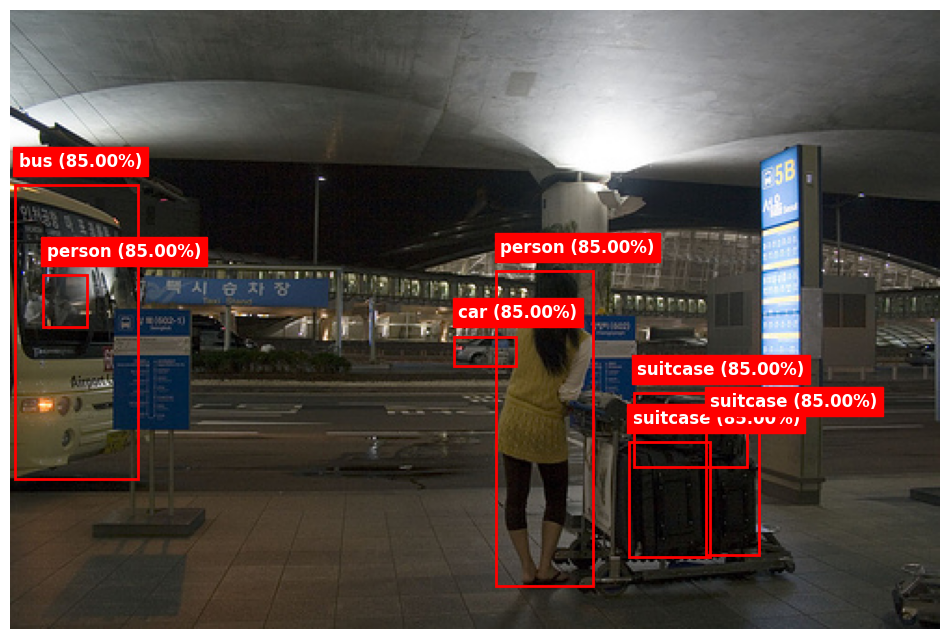

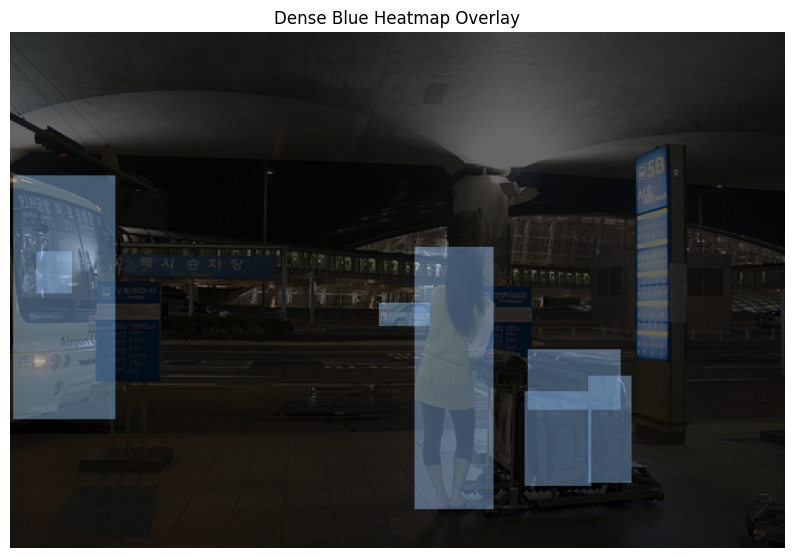

Visualizing image: 000000000328.jpg


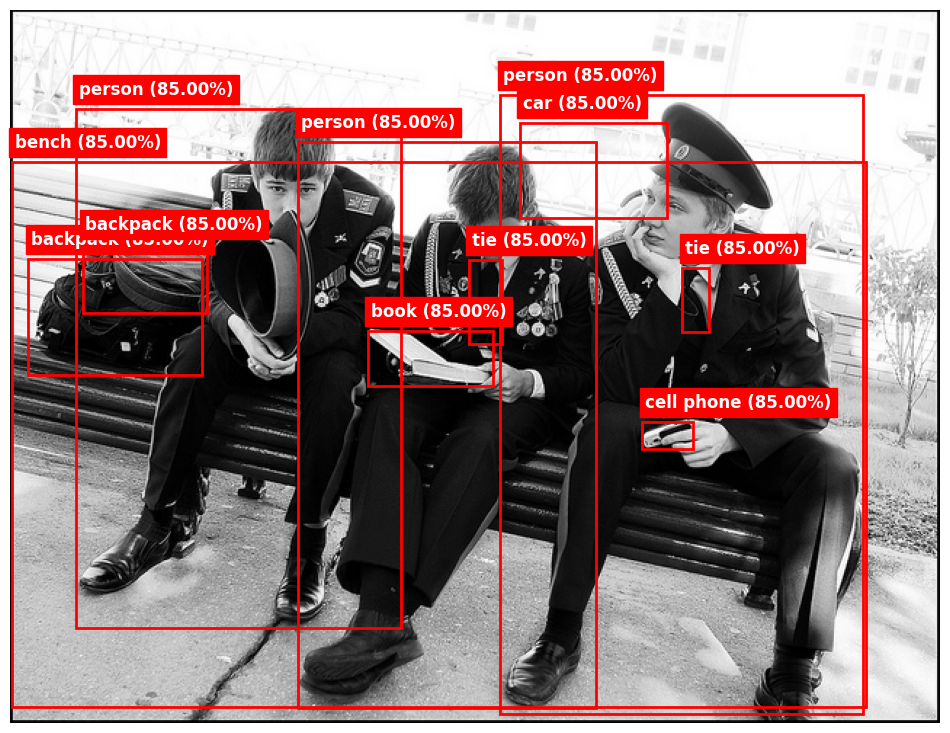

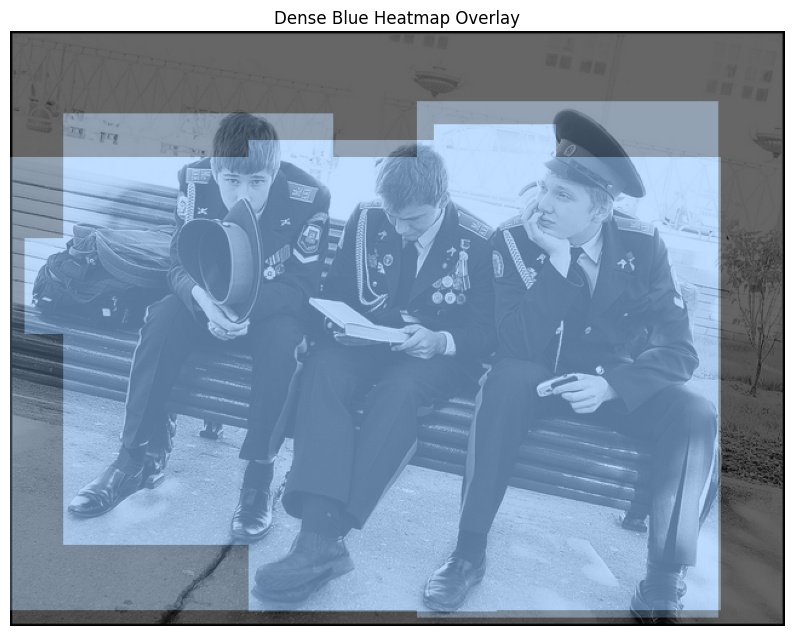

Visualizing image: 000000000419.jpg


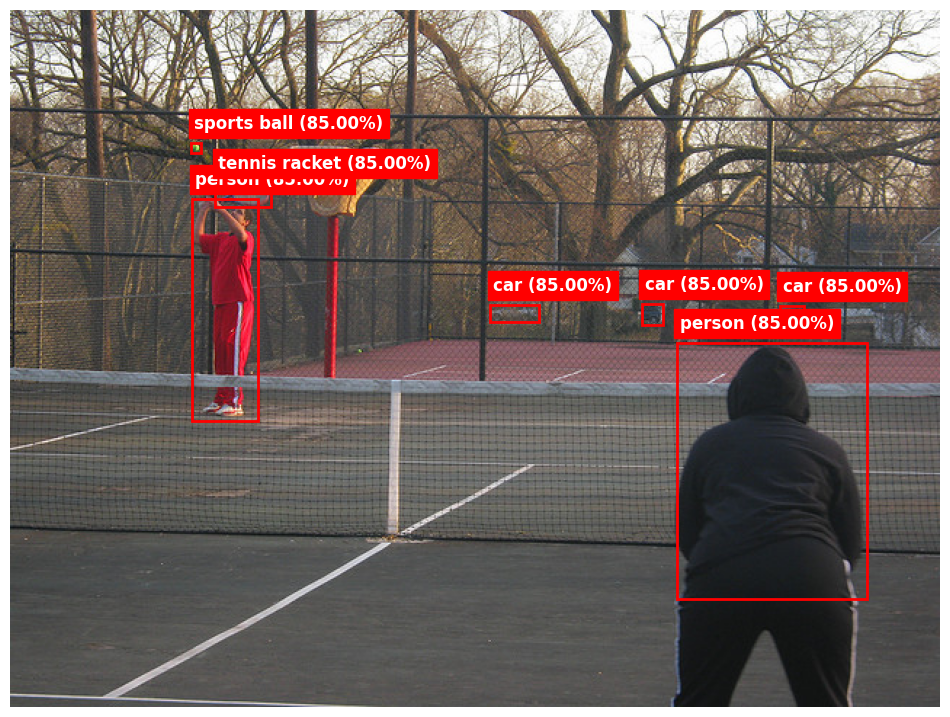

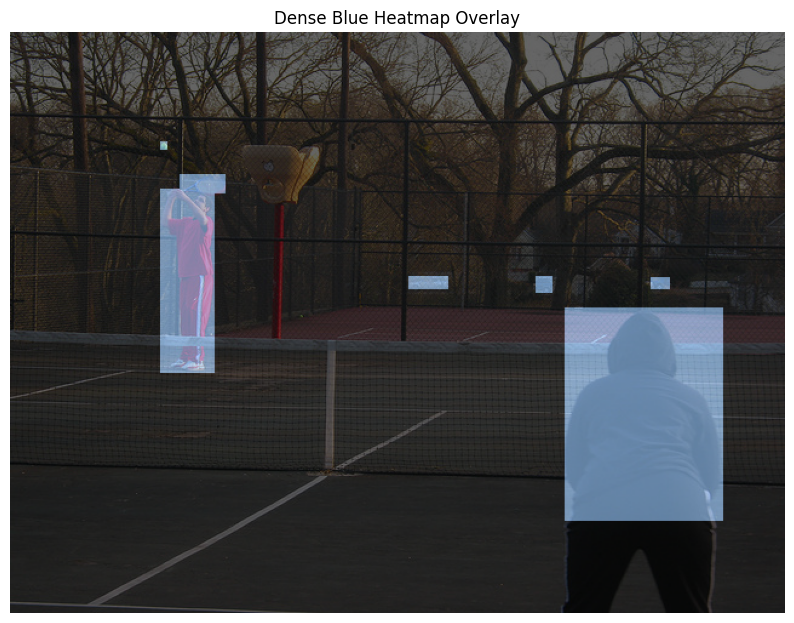

Visualizing image: 000000000722.jpg


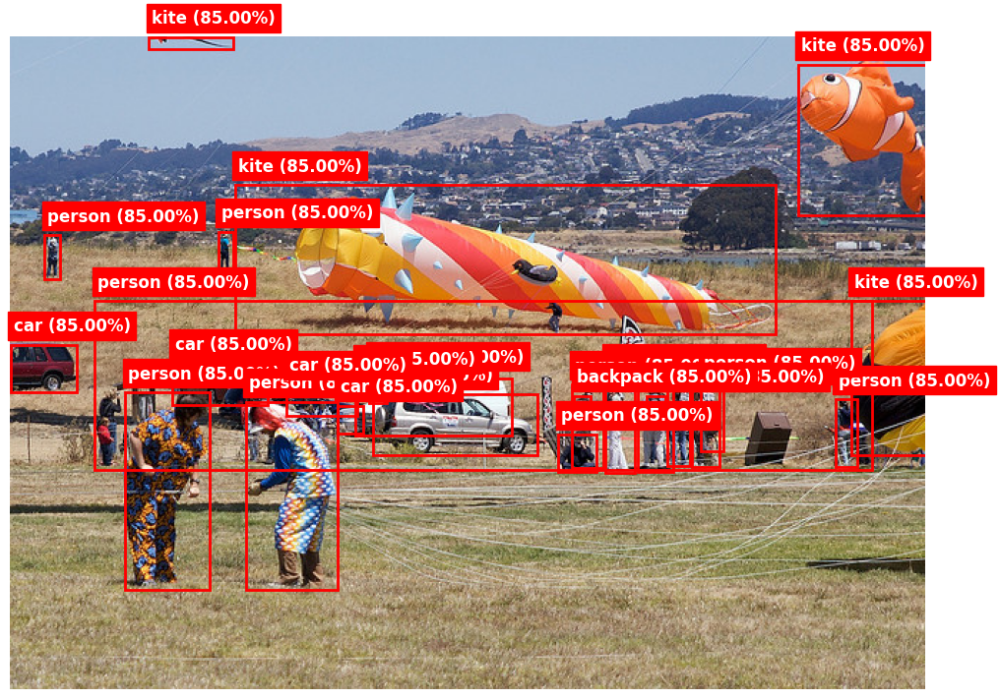

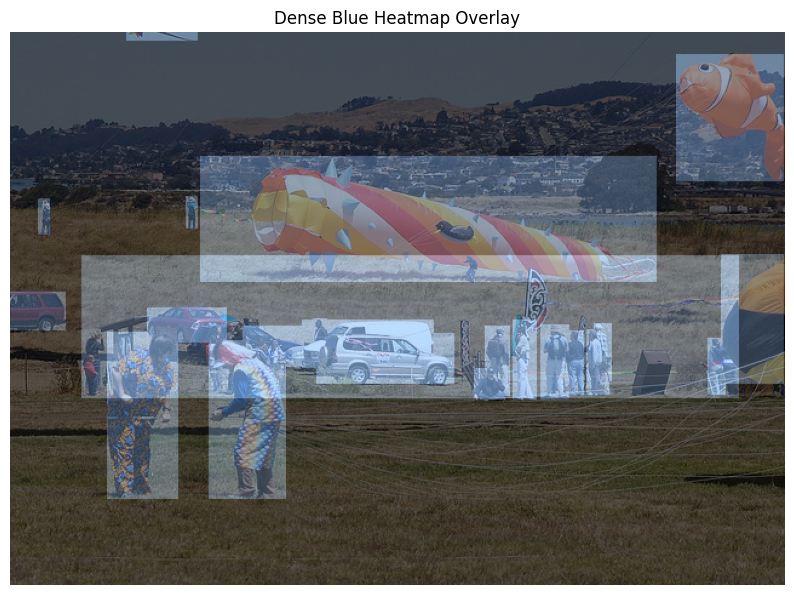

In [ ]:
# Main function to process and visualize images
if __name__ == "__main__":
    # Load annotations
    train_annotations = load_coco_annotations(TRAIN_ANNOTATION_FILE)
    train_image_annotations = map_image_ids_to_annotations(train_annotations)
    category_id_to_name = map_category_ids_to_names(train_annotations)

    # Select random images for demonstration
    sample_images = train_annotations['images'][:5]  # Get first 5 images
    sample_image_paths = [
        os.path.join(TRAIN_DIR, img['file_name'])
        for img in sample_images
    ]

    # Process and visualize each image
    for img_info, image_path in zip(sample_images, sample_image_paths):
        # Extract image ID
        image_id = img_info['id']

        # Get annotations for the image
        image_annotations = train_image_annotations[image_id]

        # Mock confidence value
        confidence = 0.85

        print(f"Visualizing image: {img_info['file_name']}")

        # Visualize image with bounding boxes and confidence
        visualize_image_with_bboxes(image_path, image_annotations, category_id_to_name, confidence)

        # Generate light blue heatmap overlay
        generate_dense_blue_heatmap_overlay(image_path, image_annotations)


In [ ]:
!pip install pycocotools

In [ ]:
import os
import torch
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset
import matplotlib.pyplot as plt
import json
from PIL import Image
import numpy as np
import cv2

# Dataset Paths
BASE_DIR = "/content/drive/MyDrive/dataset_coco"
TRAIN_DIR = os.path.join(BASE_DIR, "train-300/data")
TRAIN_ANNOTATION_FILE = os.path.join(BASE_DIR, "train-300/labels.json")
TEST_DIR = os.path.join(BASE_DIR, "test-30")
VALIDATION_DIR = os.path.join(BASE_DIR, "validation-300/data")
VALIDATION_ANNOTATION_FILE = os.path.join(BASE_DIR, "validation-300/labels.json")

# Check for CUDA availability
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


Using device: cpu


In [ ]:
class CustomCocoDataset(Dataset):
    def __init__(self, image_dir, annotation_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform

        # Load annotations from JSON
        with open(annotation_file, 'r') as f:
            self.annotations = json.load(f)

        # Map image IDs to annotations
        self.image_annotations = {}
        for ann in self.annotations['annotations']:
            image_id = ann['image_id']
            if image_id not in self.image_annotations:
                self.image_annotations[image_id] = []
            self.image_annotations[image_id].append(ann)

        # Load image metadata
        self.image_metadata = {img['id']: img['file_name'] for img in self.annotations['images']}

    def __len__(self):
        return len(self.image_metadata)

    def __getitem__(self, idx):
        image_id = list(self.image_metadata.keys())[idx]
        image_path = os.path.join(self.image_dir, self.image_metadata[image_id])

        # Load image
        image = Image.open(image_path).convert("RGB")

        # Apply transform if provided
        if self.transform:
            image = self.transform(image)

        # Get annotations
        annotations = self.image_annotations.get(image_id, [])

        return image, annotations, image_id


# data loaders

In [ ]:
# Transformations
transform = transforms.Compose([
    transforms.ToTensor()
])

# Load Train and Validation datasets
train_dataset = CustomCocoDataset(TRAIN_DIR, TRAIN_ANNOTATION_FILE, transform=transform)
validation_dataset = CustomCocoDataset(VALIDATION_DIR, VALIDATION_ANNOTATION_FILE, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
validation_loader = DataLoader(validation_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))


# Load Pretrained Mask R-CNN and Move to Device

In [ ]:
# Load Pretrained Mask R-CNN
model = models.detection.maskrcnn_resnet50_fpn(pretrained=True)
model.eval()
model.to(device)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:01<00:00, 138MB/s]


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

# Image Processing Functions (Edge Detection & Overlay)

In [ ]:
def process_image(image_tensor):
    # Convert image tensor to numpy (H, W, C)
    img_np = image_tensor.permute(1, 2, 0).cpu().numpy()
    img_np = np.clip(img_np, 0, 1)

    # Convert to grayscale
    gray = cv2.cvtColor((img_np * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)

    # Edge detection using Canny
    edges = cv2.Canny(gray, 100, 200)

    # Overlay edges on original image (in red)
    img_overlay = img_np.copy()
    img_overlay[edges == 255] = [1, 0, 0]  # Red color for edges

    return img_np, gray, edges, img_overlay


In [ ]:
def visualize_images(data_loader, model):
    model.eval()
    for images, annotations, image_ids in data_loader:
        images = [img.to(device) for img in images]
        outputs = model(images)

        for i, (image, output) in enumerate(zip(images, outputs)):
            print(f"Image ID: {image_ids[i]}")
            # Process image for visualization
            original, gray, edges, overlay = process_image(image)

            # Display Results
            fig, axs = plt.subplots(1, 4, figsize=(20, 5))
            axs[0].imshow(original)
            axs[0].set_title("Original Image")
            axs[0].axis('off')

            axs[1].imshow(gray, cmap='gray')
            axs[1].set_title("Grayscale")
            axs[1].axis('off')

            axs[2].imshow(edges, cmap='gray')
            axs[2].set_title("Edge Detection (Canny)")
            axs[2].axis('off')

            axs[3].imshow(overlay)
            axs[3].set_title("Overlay (Edges on Original)")
            axs[3].axis('off')

            plt.show()
        break  # Visualize only the first batch


Visualizing Train Dataset...
Image ID: 67


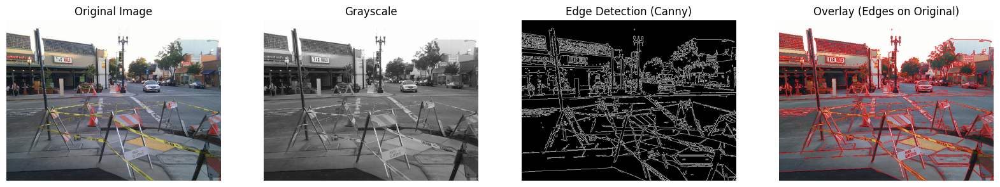

Image ID: 130


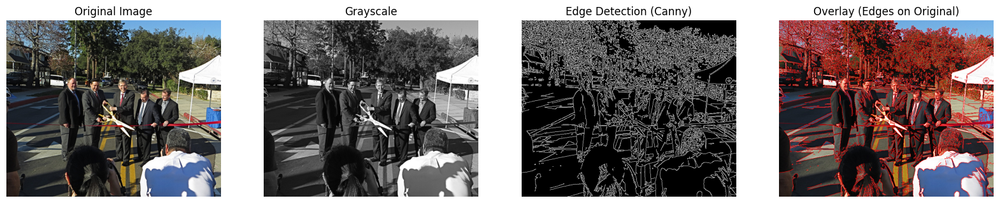

Image ID: 59


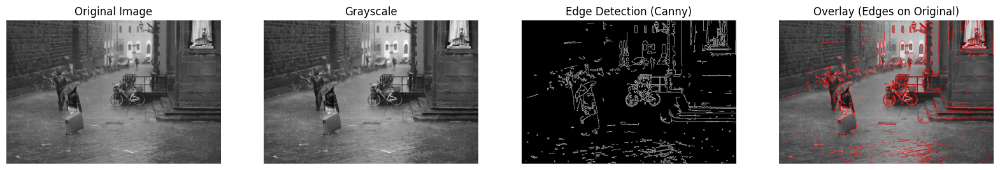

Image ID: 202


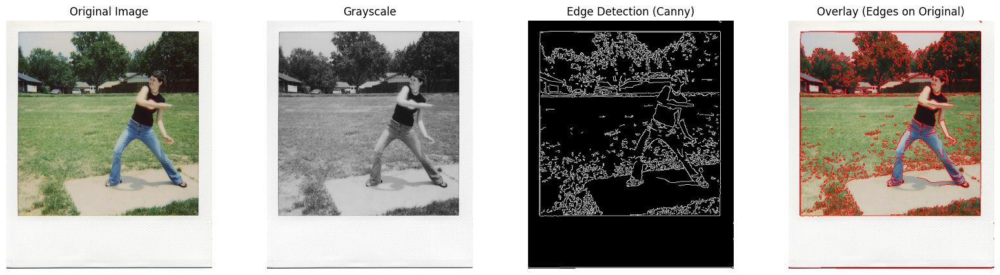

In [ ]:
print("Visualizing Train Dataset...")
visualize_images(train_loader, model)


Visualizing Validation Dataset...
Image ID: 1


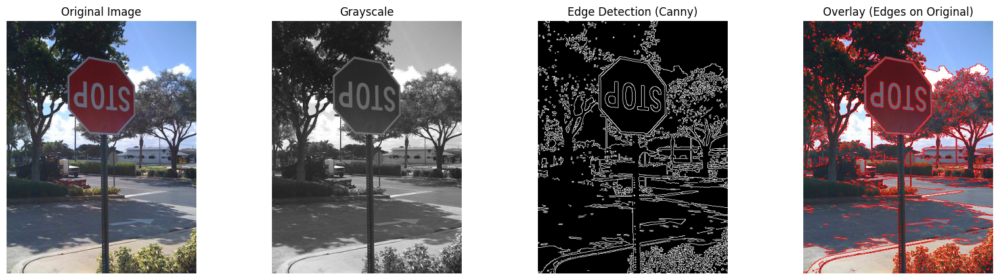

Image ID: 2


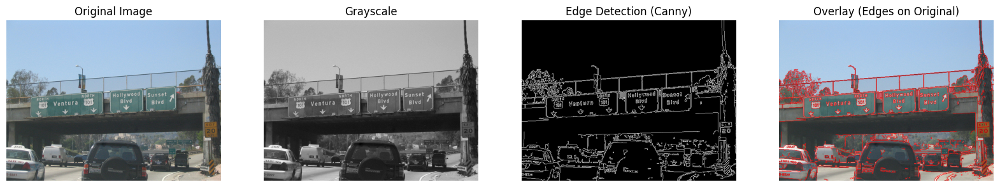

Image ID: 3


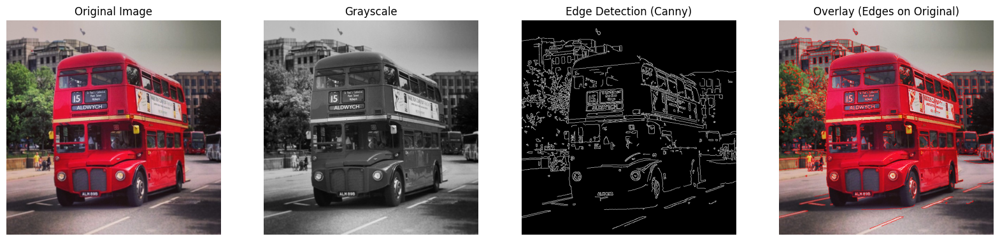

Image ID: 4


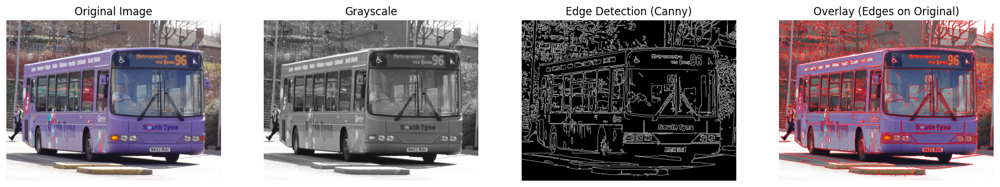

In [ ]:
print("Visualizing Validation Dataset...")
visualize_images(validation_loader, model)


# Yolo model

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.0/899.0 kB 15.5 MB/s eta 0:00:00


In [ ]:
import os
import cv2
from ultralytics import YOLO
from matplotlib import pyplot as plt

# Paths to the dataset folders
BASE_DIR = "/content/drive/MyDrive/dataset_coco"
TRAIN_DIR = os.path.join(BASE_DIR, "train-300/data")
TRAIN_ANNOTATION_FILE = os.path.join(BASE_DIR, "train-300/labels.json")
TEST_DIR = os.path.join(BASE_DIR, "test-30")
VALIDATION_DIR = os.path.join(BASE_DIR, "validation-300/data")
VALIDATION_ANNOTATION_FILE = os.path.join(BASE_DIR, "validation-300/labels.json")

# Check the number of images in validation directory
print(f"Number of images in validation set: {len(os.listdir(VALIDATION_DIR))}")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Number of images in validation set: 300


# Load Pretrained YOLOv8 Model

In [ ]:
# Loading the YOLOv8 model
model = YOLO('yolov8n.pt')
print("YOLOv8 model loaded successfully!")


100%|██████████| 6.25M/6.25M [00:00<00:00, 75.2MB/s]

YOLOv8 model loaded successfully!


# Run Inference on Validation Image

Test Image Path: /content/drive/MyDrive/dataset_coco/validation-300/data/000000138979.jpg

image 1/1 /content/drive/MyDrive/dataset_coco/validation-300/data/000000138979.jpg: 448x640 3 persons, 1 car, 1 bus, 1 traffic light, 881.2ms
Speed: 2.8ms preprocess, 881.2ms inference, 16.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


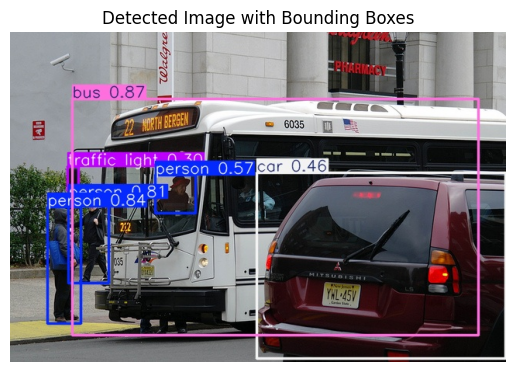

In [ ]:
# Selecting a test image from the validation dataset
test_image_name = os.listdir(VALIDATION_DIR)[0]  # Take the first image
test_image_path = os.path.join(VALIDATION_DIR, test_image_name)
print(f"Test Image Path: {test_image_path}")

# Run YOLO inference
results = model.predict(source=test_image_path, save=True)

# Load and display the detected image
detected_image_path = 'runs/detect/predict/' + test_image_name  # YOLO output path
detected_image = cv2.imread(detected_image_path)

# Display the image with detections
plt.imshow(cv2.cvtColor(detected_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Detected Image with Bounding Boxes")
plt.show()


# Extract Detection Results

In [ ]:
# Extract and display bounding box information
print("Detection Results:")
for result in results:
    boxes = result.boxes.xyxy  # Bounding box coordinates
    confidence = result.boxes.conf  # Confidence scores
    class_ids = result.boxes.cls  # Class IDs
    class_names = result.names  # Class names

    for box, conf, cls_id in zip(boxes, confidence, class_ids):
        print(f"Bounding Box (x1, y1, x2, y2): {box.tolist()}")
        print(f"Confidence: {conf.item():.2f}")
        print(f"Class: {class_names[int(cls_id)]}")


Detection Results:
Bounding Box (x1, y1, x2, y2): [80.2484130859375, 87.65567016601562, 604.733642578125, 391.9742736816406]
Confidence: 0.87
Class: bus
Bounding Box (x1, y1, x2, y2): [48.50602722167969, 226.33291625976562, 91.3038330078125, 376.9688415527344]
Confidence: 0.84
Class: person
Bounding Box (x1, y1, x2, y2): [75.00697326660156, 215.5489501953125, 127.70268249511719, 324.6558837890625]
Confidence: 0.81
Class: person
Bounding Box (x1, y1, x2, y2): [187.3848876953125, 185.26925659179688, 239.05657958984375, 234.18954467773438]
Confidence: 0.57
Class: person
Bounding Box (x1, y1, x2, y2): [318.232177734375, 182.4296417236328, 639.9683837890625, 421.43316650390625]
Confidence: 0.46
Class: car
Bounding Box (x1, y1, x2, y2): [74.61416625976562, 174.83680725097656, 88.23432922363281, 205.6162567138672]
Confidence: 0.30
Class: traffic light


# Heatmap Effect over Detected Areas

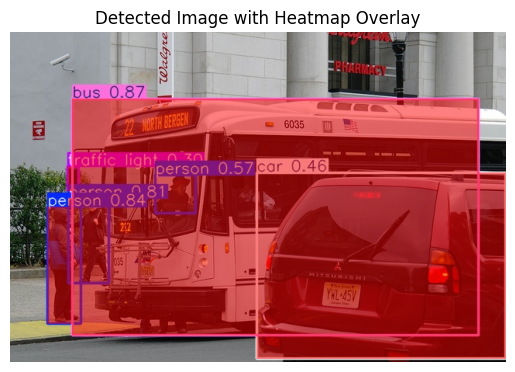

In [ ]:
# Generate a heatmap overlay based on detected bounding boxes
heatmap = detected_image.copy()

for result in results:
    for box in result.boxes.xyxy:  # Get bounding box coordinates
        x1, y1, x2, y2 = map(int, box)
        color = (0, 0, 255)  # Blue color for heatmap
        cv2.rectangle(heatmap, (x1, y1), (x2, y2), color, -1)  # Filled rectangle

# Overlay heatmap onto the original image
blue_shaded = cv2.addWeighted(heatmap, 0.5, detected_image, 0.5, 0)

# Display the heatmap
plt.imshow(cv2.cvtColor(blue_shaded, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Detected Image with Heatmap Overlay")
plt.show()


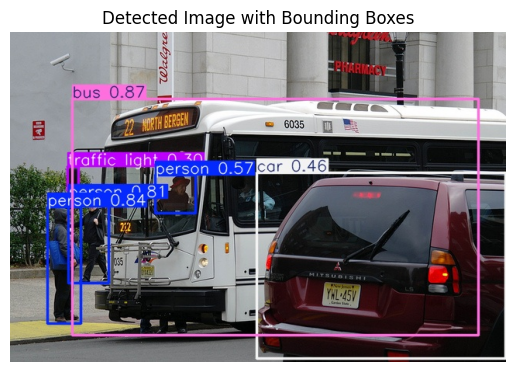

In [ ]:
# Display original image with bounding boxes
plt.imshow(cv2.cvtColor(detected_image, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Detected Image with Bounding Boxes")
plt.show()
